In [5]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [6]:
import os
import tqdm

import pandas as pd
import seaborn

from fbio.dataframe import RegionDataFrame
from fbio.fragments_h5 import FragmentsH5

from ravel.fragment_array import RegionFragmentArray, FragmentMatrix, Region, merge_fragment_arrays
from ravel.bio.frag.fragment_matrix import merge_fragment_matrices

In [7]:
pd.read_csv("/scratch/karius/Merged_meta_data_CD_UC_foundation.csv")

,LibraryID,SeqRun,SampleID,library_name,Index,SNM,IDSpike,BioMaterial,IBD_ID,DEIDENTIFIED_MASTER_PATIENT_ID,...,Chemotherapeutic,Corticosteroids,Probiotic,Anti_diarrheal,NSAID,Antibiotic,Cluster,SEX_x,Aliquote_ID,SEX_y
0,RD-56150-Lib1,NC-14151,RD-56150,RD-56150-Lib1,NEB_E6440_A01,"SNM.v3, SNM.v4","136 (v3), 3001 (v4)",plasma,9032553,9032553.0,...,1.0,1.0,1.0,1.0,0.0,0.0,Patient Group 1,NaN,NaN,NaN
1,RD-56153-Lib1,NC-14151,RD-56153,RD-56153-Lib1,NEB_E6440_D01,"SNM.v3, SNM.v4","136 (v3), 3002 (v4)",plasma,9032562,9032562.0,...,1.0,1.0,0.0,0.0,1.0,1.0,Patient Group 2,NaN,NaN,NaN
2,RD-56154-Lib1,NC-14151,RD-56154,RD-56154-Lib1,NEB_E6440_E01,"SNM.v3, SNM.v4","136 (v3), 3003 (v4)",plasma,9032139,9032139.0,...,1.0,0.0,0.0,0.0,0.0,0.0,Patient Group 4,NaN,NaN,NaN
3,RD-56155-Lib1,NC-14151,RD-56155,RD-56155-Lib1,NEB_E6440_F01,"SNM.v3, SNM.v4","136 (v3), 3004 (v4)",plasma,9032171,9032171.0,...,0.0,0.0,0.0,0.0,0.0,0.0,Patient Group 3,NaN,NaN,NaN
4,RD-56156-Lib1,NC-14151,RD-56156,RD-56156-Lib1,NEB_E6440_G01,"SNM.v3, SNM.v4","136 (v3), 3066 (v4)",plasma,12078136,12078136.0,...,0.0,1.0,1.0,1.0,0.0,0.0,Patient Group 1,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
361,RD-36399-Lib1,NC-13295,RD-36399,RD-36399-Lib1,NEB_E6440_B01,"SNM.v3, SNM.v4","ID_136 (v3), 3109 (v4)",PPT plasma,[BDP_005],NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
362,RD-36400-Lib1,NC-13295,RD-36400,RD-36400-Lib1,NEB_E6440_C01,"SNM.v3, SNM.v4","ID_136 (v3), 3110 (v4)",PPT plasma,[BDP_005],NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
363,RD-36401-Lib1,NC-13295,RD-36401,RD-36401-Lib1,NEB_E6440_D01,"SNM.v3, SNM.v4","ID_136 (v3), 3111 (v4)",PPT plasma,[BDP_005],NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
364,RD-36402-Lib1,NC-13295,RD-36402,RD-36402-Lib1,NEB_E6440_E01,"SNM.v3, SNM.v4","ID_136 (v3), 3112 (v4)",PPT plasma,[BDP_005],NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [8]:
import glob

def load_sample_metadata_df():    
    sample_ids_to_samples = {}
    for fname in glob.glob("/scratch/karius/*.fragments.h5"):
        sample_id = fname.split("/")[3].split('.')[1].split('_')[0][:-5]
        sample_ids_to_samples[sample_id] = fname

    assert 1 == pd.read_csv("/scratch/karius/Merged_meta_data_CD_UC_foundation.csv")["SampleID"].value_counts().max()
    metadata = pd.read_csv("/scratch/karius/Merged_meta_data_CD_UC_foundation.csv")
    metadata = metadata.query("SampleID in @sample_ids_to_samples.keys()").set_index("SampleID")[['DIAGNOSIS', 'ENDO_CATEGORY', 'Cluster', 'SITE_NUMBER']]
    return metadata, sample_ids_to_samples

In [9]:
metadata, sample_ids_to_samples = load_sample_metadata_df()

In [10]:
len(sample_ids_to_samples)

18

In [11]:
frag_h5s = [FragmentsH5(sample_ids_to_samples[sample_id]) for sample_id in sample_ids_to_samples.keys()]

In [12]:
import seaborn as sns
import numpy as np

def plot_and_load_ref_fl_dist():
    max_frag_len = 512
    sns.set(rc={'figure.figsize':(20, 8)})
    columns = {}
    for sample_id, fname in sample_ids_to_samples.items():
        cnts = FragmentsH5(fname).fragment_length_counts[:max_frag_len]
        # normalize to library depth
        cnts = cnts/cnts.sum()
        columns[sample_id] = cnts

    fl_df = pd.DataFrame(columns)
    fl_df = fl_df.set_index(fl_df.index+1)

    ref_fl_dist = fl_df.mean(axis=1)
    ref_fl_dist = ref_fl_dist/ref_fl_dist.sum()

    color_mapping = dict(Severe='red', Moderate='orange', Mild='yellow', Remission='green')
    colors = [color_mapping[x] for x in metadata.loc[fl_df.columns].ENDO_CATEGORY.tolist()]

    fl_df.loc[:, 'Reference'] = ref_fl_dist
    colors.append('black')

    fl_df.plot(color=colors)

    return ref_fl_dist, color_mapping

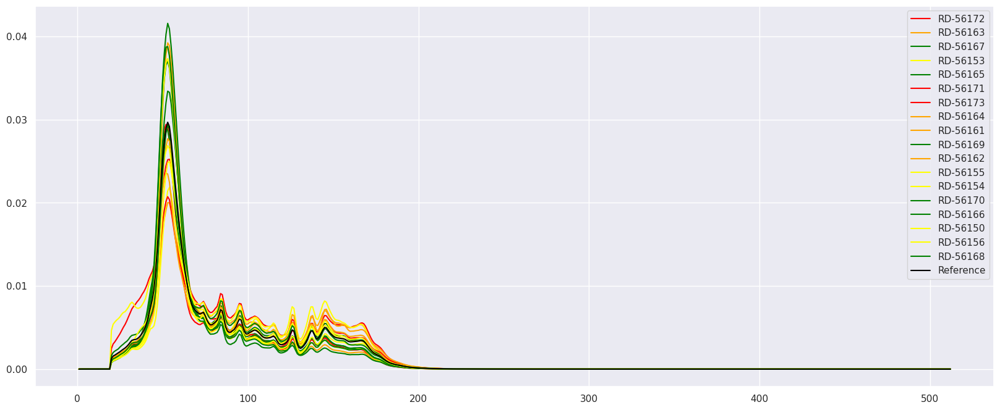

In [13]:
ref_fl_dist, color_mapping = plot_and_load_ref_fl_dist()

# TSS Sites

In [14]:
from itertools import chain

In [15]:
def label_gene_rdf(rdf):
    rdf = rdf.copy()

    blood_labels = rdf.set_binary_label_by_thresholds(
        blood_cell_eids,
        on_threshold=10,
        off_threshold=0.1,
        drop_unlabeled_records=False,
    )['label'].rename('blood_label')

    gi_labels = rdf.set_binary_label_by_thresholds(
        gi_cell_eids,
        on_threshold=10,
        off_threshold=0.1,
        drop_unlabeled_records=False,
    )['label'].rename('gi_label')


    rdf.loc[:, 'cell_type'] = None
    rdf.loc[(gi_labels == 1) & (blood_labels == 1), 'cell_type'] = 'all'
    rdf.loc[(gi_labels == 1) & (blood_labels == 0), 'cell_type'] = 'gi'
    rdf.loc[(gi_labels == 0) & (blood_labels == 1), 'cell_type'] = 'blood'
    rdf.loc[(gi_labels == 0) & (blood_labels == 0), 'cell_type'] = 'none'

    # if 'gene_id' not in rdf.columns:
    #     rdf['gene_id'] = rdf.id.str.extract('(ENSG\d+)\..+')

    rdf = rdf.dropna().reset_index(drop=True)
    
    return rdf

# TSS Analysis

In [16]:
def get_fas(regions):
    fas = {}
    for record in tqdm.tqdm(regions.itertuples(), total=regions.shape[0]):
        inner_fas = []
        try:
            for frag_h5 in frag_h5s:
                inner_fas.append(RegionFragmentArray.from_fragments_h5(frag_h5, Region(record.contig, record.start, record.stop, record.strand), include_fragment_strand=True, flip_data_to_match_region_strand=False, min_mapq=10).drop_duplicate_fragments()) 
            if len(inner_fas) > 0:
                fas[record.Index] = merge_fragment_arrays(inner_fas)
        except ValueError:
            continue

    return fas


def get_labeled_tss_s():
    tss_s = load_tss_s_df(ref='hg38')
    gene_expression = load_gene_expression_df(ref='hg38').set_index("ens_id")
    filtered_tss_s = tss_s.query("num_tss_in_gene == 1").merge_gene_expression(gene_expression).copy()

    gi_cell_eids = sorted(x for x in set(chain(*[CELL_ANATOMY_TO_CELL_EID[x] for x in ['gi_duodenum', 'gi_colon', 'gi_rectum', 'gi_stomach', 'gi_intestine', 'gi_esophagus']])) if x in gene_expression.columns)
    blood_cell_eids = sorted(x for x in CELL_ANATOMY_TO_CELL_EID['blood'] if x in gene_expression.columns)

    blood_labels = filtered_tss_s.set_binary_label_by_thresholds(
        blood_cell_eids,
        on_threshold=25,
        off_threshold=0.01,
        drop_unlabeled_records=False,
    )['label'].rename('blood_label')

    gi_labels = filtered_tss_s.set_binary_label_by_thresholds(
        gi_cell_eids,
        on_threshold=25,
        off_threshold=0.01,
        drop_unlabeled_records=False,
    )['label'].rename('gi_label')


    filtered_tss_s.loc[:, 'cell_type'] = None
    filtered_tss_s.loc[(gi_labels == 1) & (blood_labels == 1), 'cell_type'] = 'all'
    filtered_tss_s.loc[(gi_labels == 1) & (blood_labels == 0), 'cell_type'] = 'gi'
    filtered_tss_s.loc[(gi_labels == 0) & (blood_labels == 1), 'cell_type'] = 'blood'
    filtered_tss_s.loc[(gi_labels == 0) & (blood_labels == 0), 'cell_type'] = 'none'

    filtered_tss_s['gene_id'] = filtered_tss_s.id.str.extract('(ENSG\d+)\..+')

    filtered_tss_s = filtered_tss_s.dropna().reset_index(drop=True)
    
    return filtered_tss_s


In [17]:
def attach_fragment_arrays(rdf):
    fas = get_fas(rdf)
    df = rdf.join(pd.Series(fas).rename('fa')).dropna()
    df['fa_length'] = [fa.length for fa in df.fa.tolist()]
    df['n_fragments'] = [fa.n_fragments for fa in df.fa.tolist()]
    
    return df

In [18]:
import copy
from dataclasses import dataclass, field, replace
from fbio.plot.tracks import CoverageTrack, VLine, Line, Tracks, VplotTrack, VectorTrack, VectorTracks

FRAGMENT_BANDS = [(40, 60), (60, 100), (110, 500)]
SMOOTHING_WINDOWS = [300, 700, 1500]

# frag_h5 = FragmentsH5("/scratch/karius/finished.fragments.h5") # "/scratch/test_samples/SEQRUN48_LIBRARY577.fragments.h5")
patient_groups = ['Patient Group  1', 'Patient Group  2']
patient_groups = metadata.Cluster.unique().tolist()

severities = ('Remission', 'Mild', 'Moderate', 'Severe')

from fbio.plot.tracks import CoverageTrack, VLine, Tracks, VplotTrack



def make_single_strand_tss_tracks(fa, include_vplot=False, tss_or_polya=None):
    if tss_or_polya == 'tss':
        vline_pos = 1024*8
    elif tss_or_polya == 'polya':
        vline_pos = fa.length - 1024*8
    else:
        raise ValueError(f"Unrecognized value for tss_or_polya '{tss_or_polya}'")

    region_size = fa.shape[1]

    region_size//2+145
    first_nuc=132
    offset=175
    tracks = Tracks()
    if include_vplot:
        tracks.append(VplotTrack(fa, fa.plot_region, sum_pool_by=2))

    for fraction, sm_win in zip(FRAGMENT_BANDS, SMOOTHING_WINDOWS):
        for TrackCls, ymin in zip((StrandSplitCoverageTrack, CoverageDifferenceTrack), (0, None)):
            tracks.append(TrackCls(fa, fa.plot_region, coverage_type='midpoint', n_boot_coverage=0, fraction=fraction, smooth_window=sm_win, ylim=(ymin, None),
                                    vlines=[VLine(x=vline_pos)], 
                                    name=f'{fraction[0]} - {fraction[1]} bp Fraction)'))
    return tracks

# Gene Analysis

In [24]:
def load_gencode_rdf():
    gencode_rdf = pd.read_table(
        "/scratch/nboley/gencode/gencode.v39.basic.annotation.protein_coding.gff3",
        usecols=[0, 2, 3, 4, 6, 8],
        names=["contig", "element", "start", "stop", "strand", "meta"],
    ).query("contig not in ['chrM', 'chrY'] and element in ['three_prime_UTR', 'five_prime_UTR']") # 'gene', 'transcript', 'exon', 
    gencode_rdf['gene_id'] = gencode_rdf.meta.str.extract(';gene_id=(ENSG?\d+)\.\d+;')
    gencode_rdf['gene_name'] = gencode_rdf.meta.str.extract(';gene_name=(.+?);')
    gencode_rdf = gencode_rdf.drop(columns=['meta'])
    gencode_rdf = gencode_rdf.drop_duplicates()
    return RegionDataFrame(gencode_rdf.sort_values(["contig", "start"]), ref='hg38')

def load_genes_rdf():
    _rdf = load_gencode_rdf()

    tes_s = []
    for idx, sub_df in _rdf.query(f"strand == '+' and element == 'three_prime_UTR'").groupby('gene_id')['stop']:
        tes_s.append([idx, sub_df.agg(lambda x: pd.Series.mode(x)[0])])
    for idx, sub_df in _rdf.query(f"strand == '-' and element == 'three_prime_UTR'").groupby('gene_id')['start']:
        tes_s.append([idx, sub_df.agg(lambda x: pd.Series.mode(x)[0])])

    tss_s = []
    for idx, sub_df in _rdf.query(f"strand == '+' and element == 'five_prime_UTR'").groupby('gene_id')['start']:
        tss_s.append([idx, sub_df.agg(lambda x: pd.Series.mode(x)[0])])
    for idx, sub_df in _rdf.query(f"strand == '-' and element == 'five_prime_UTR'").groupby('gene_id')['stop']:
        tss_s.append([idx, sub_df.agg(lambda x: pd.Series.mode(x)[0])])

    tss_and_tes = pd.DataFrame(tss_s, columns=['gene_id', 'tss']).set_index('gene_id').join(pd.DataFrame(tes_s, columns=['gene_id', 'tes']).set_index('gene_id')).dropna().astype(int)
    # return tss_and_tes, _rdf # .set_index('gene_id')[['contig', 'strand']]

    _rdf = _rdf[['gene_id', 'gene_name', 'contig', 'strand']].drop_duplicates().set_index('gene_id').join(tss_and_tes, how='inner')
    _rdf['start'] = pd.DataFrame(_rdf)[['tss', 'tes']].min(axis=1)
    _rdf['stop'] = pd.DataFrame(_rdf)[['tss', 'tes']].max(axis=1)
    
    return _rdf

def get_labeled_genes():
    gencode_rdf = load_genes_rdf()

    gene_expression = load_gene_expression_df(ref='hg38').set_index("ens_id")
    blood_cell_eids = sorted(x for x in CELL_ANATOMY_TO_CELL_EID['blood'] if x in gene_expression.columns)
        
    return gencode_rdf.join(gene_expression[blood_cell_eids].mean(axis=1).rename('expression')).dropna().reset_index().drop(columns=['tss', 'tes'])

In [25]:
gencode_rdf = load_genes_rdf()

In [28]:
gencode_rdf

,gene_name,contig,strand,tss,tes,start,stop
gene_id,,,,,,,
ENSG00000186092,OR4F5,chr1,+,65419,71585,65419,71585
ENSG00000187634,SAMD11,chr1,+,923923,944574,923923,944574
ENSG00000188976,NOC2L,chr1,-,959256,944203,944203,959256
ENSG00000187961,KLHL17,chr1,+,960584,965719,960584,965719
ENSG00000187583,PLEKHN1,chr1,+,966482,975008,966482,975008
...,...,...,...,...,...,...,...
ENSG00000277745,H2AB3,chrX,-,155460005,155459415,155459415,155460005
ENSG00000185973,TMLHE,chrX,-,155545277,155489011,155489011,155545277
ENSG00000168939,SPRY3,chrX,+,155612588,155776795,155612588,155776795


In [27]:
gencode_rdf.resize_regions(10)

,gene_name,contig,strand,tss,tes,start,stop
gene_id,,,,,,,
ENSG00000186092,OR4F5,chr1,+,65419,71585,68497,68507
ENSG00000187634,SAMD11,chr1,+,923923,944574,934243,934253
ENSG00000188976,NOC2L,chr1,-,959256,944203,951725,951735
ENSG00000187961,KLHL17,chr1,+,960584,965719,963146,963156
ENSG00000187583,PLEKHN1,chr1,+,966482,975008,970740,970750
...,...,...,...,...,...,...,...
ENSG00000277745,H2AB3,chrX,-,155460005,155459415,155459705,155459715
ENSG00000185973,TMLHE,chrX,-,155545277,155489011,155517139,155517149
ENSG00000168939,SPRY3,chrX,+,155612588,155776795,155694686,155694696


In [ ]:
gencode_rdf.resize_regions(10)

In [20]:
"""
Cluster	scRNA

1	HSC - Hematopoietic Stem Cells
* 2	Early Eryth. - Early Erythroid Cells
* 3	Late Eryth. - Late Erythroid Cells
4	Early Basophil Cells
* 5	CMP/LMPP - Common Myeloid Progenitor / lymphoid-primed multipotent progenitors
* 6	CLP 1 - Common Lymphoid Progenitor
* 7	GMP - Granulocyte-Monocyte progenitors
* 8	GMP/Neut - Granulocyte-Monocyte progenitors / Neutrophil
9	pDC - Plasmacytoid Dendritic Cell
10	cDC - Classical Dendritic CElls
* 11	CD14 Mono 1 - CD14+ Monocyte Cells
* 12	CD14 Mono 2 - CD14+ Monocyte Cells
* 13	CD16 Mono - CD16+ Monocyte Cells
14	Unk - Unkown
* 15	CLP 2 - Common Lymphoid Progenitor
16	Pre B - Pre B-Cell Progenitor
17	B - B Cells
18	Plasma - Plasma Cells
19	CD8 N - CD8+ Naïve Cells
20	CD4 N 1 - CD4+ Naïve Cells
21	CD4 N 2 - CD4+ Naïve Cells
22	CD4 M - CD4+ Memory Cells
23	CD8 EM - CD8+ Effector Memory Cells
24	CD8 CM - CD8+ Central Memory Cells
25	NK - Natural Killer Cells
26	Unk - Unkown
"""


cluster_names_and_weights = """
Early_Erythroid_Cells 0.17
Late_Erythroid_Cells 0.15
Myeloid_Progenitor 0.1
Lymphoid_Progenitor_1 0.08
Granulocyte-Monocyte_Progenitor 0.16
Neutrophil 0.21
CD14+_Monocyte_Cells_1 0.05
CD14+_Monocyte_Cells_2 0.04
CD16+_Monocyte_Cells 0.04
Lymphoid_Progenitor_2 0.08
""".strip().split("\n")
cluster_names_and_weights = dict((x.split()[0], float(x.split()[1])) for x in cluster_names_and_weights)

def load_SC_RNA_labeled_genes():
    """
    
    """
    # load the raw scRNA-Seq counts, normalize buy depth, and then join with the gencode annotation
    res = pd.read_pickle("/scratch/karius/reference/sc_rnaseq.pickle")
    grpd_counts = res.groupby(by=[x.split('_')[0] for x in res.columns], axis=1).sum()
    
    tpms = grpd_counts/(grpd_counts.sum()/1e6)
    tpms = tpms[['02', '03', '05', '06', '07', '08', '11', '12', '13', '15']]
    # taking advantage of dict keys remaining sorted
    tpms.columns = list(cluster_names_and_weights.keys())
    
    gencode_rdf = load_genes_rdf()

    # join the tpms to gencode genes
    tpms = gencode_rdf.reset_index().set_index('gene_name').join(tpms).drop(columns=['tss', 'tes']).reset_index().rename(columns={'index': 'gene_name'}).set_index(['gene_name', 'gene_id', 'contig', 'strand', 'start', 'stop']).dropna()

    # make a conservative label set
    label = np.empty(tpms.shape[0], dtype='U3')
    label[tpms.max(axis=1) < 1e-6] = 'off'
    label[tpms.min(axis=1) > 5] = 'on'
    on_off_rdf = RegionDataFrame(pd.DataFrame(label, index=tpms.index, columns=['label']).query("label != ''").reset_index(), ref='hg38')

    # set expression by taking a weighted sum over the relevant sub-types
    expression_rdf = RegionDataFrame(pd.DataFrame(np.matmul(tpms.values, np.array(list(cluster_names_and_weights.values()))), index=tpms.index, columns=['expression']).reset_index(), ref='hg38')

    return expression_rdf

In [21]:
labeled_genes = get_labeled_genes()

AssertionError: Missing these columns in dataframe: {'stop', 'contig', 'start'}, found Index(['ENSG00000186092', 'ENSG00000187634', 'ENSG00000188976', 'ENSG00000187961', 'ENSG00000187583', 'ENSG00000187642', 'ENSG00000188290', 'ENSG00000187608', 'ENSG00000188157', 'ENSG00000237330',
       ...
       'ENSG00000155961', 'ENSG00000155962', 'ENSG00000277858', 'ENSG00000288709', 'ENSG00000277150', 'ENSG00000277745', 'ENSG00000185973', 'ENSG00000168939', 'ENSG00000124333', 'ENSG00000124334'], dtype='object', name='gene_id', length=19243).

In [ ]:
labeled_genes

In [18]:
polya_rdf = attach_fragment_arrays(labeled_genes.expand_regions(right=labeled_genes.region_lengths, strand_aware=True, discard_invalid_resizes=True).resize_regions(4096).query("strand == '+' and expression > 10"))
tss_rdf = attach_fragment_arrays(labeled_genes.expand_regions(left=labeled_genes.region_lengths, strand_aware=True, discard_invalid_resizes=True).resize_regions(4096).query("strand == '+' and expression > 10"))

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3407/3407 [04:31<00:00, 12.55it/s]


In [86]:
def make_single_strand_bndry(fa, include_vplot=True):
    vline_pos = fa.length/2
    region_size = fa.shape[1]

    region_size//2+145
    first_nuc=132
    offset=175
    tracks = Tracks()
    if include_vplot:
        tracks.append(VplotTrack(fa, fa.plot_region, sum_pool_by=2))

    for fraction, sm_win in zip(FRAGMENT_BANDS, SMOOTHING_WINDOWS):
        for TrackCls, ymin in zip((StrandSplitCoverageTrack, CoverageDifferenceTrack), (0, None)):
            tracks.append(TrackCls(fa, fa.plot_region, coverage_type='midpoint', n_boot_coverage=0, fraction=fraction, smooth_window=10, ylim=(ymin, None),
                                    vlines=[VLine(x=vline_pos)], 
                                    name=f'{fraction[0]} - {fraction[1]} bp Fraction)'))
    return tracks

(<Figure size 2500x1600 with 9 Axes>,
 [<AxesSubplot:title={'center':' 5882896 frags'}>,
  <AxesSubplot:title={'center':'40 - 60 bp Fraction) - Fwd Strand 40 - 60 bp Fraction) - Rev Strand'}>,
  <AxesSubplot:title={'center':'40 - 60 bp Fraction)'}>,
  <AxesSubplot:title={'center':'60 - 100 bp Fraction) - Fwd Strand 60 - 100 bp Fraction) - Rev Strand'}>,
  <AxesSubplot:title={'center':'60 - 100 bp Fraction)'}>,
  <AxesSubplot:title={'center':'110 - 500 bp Fraction) - Fwd Strand 110 - 500 bp Fraction) - Rev Strand'}>,
  <AxesSubplot:title={'center':'110 - 500 bp Fraction)'}, xlabel='NA'>])

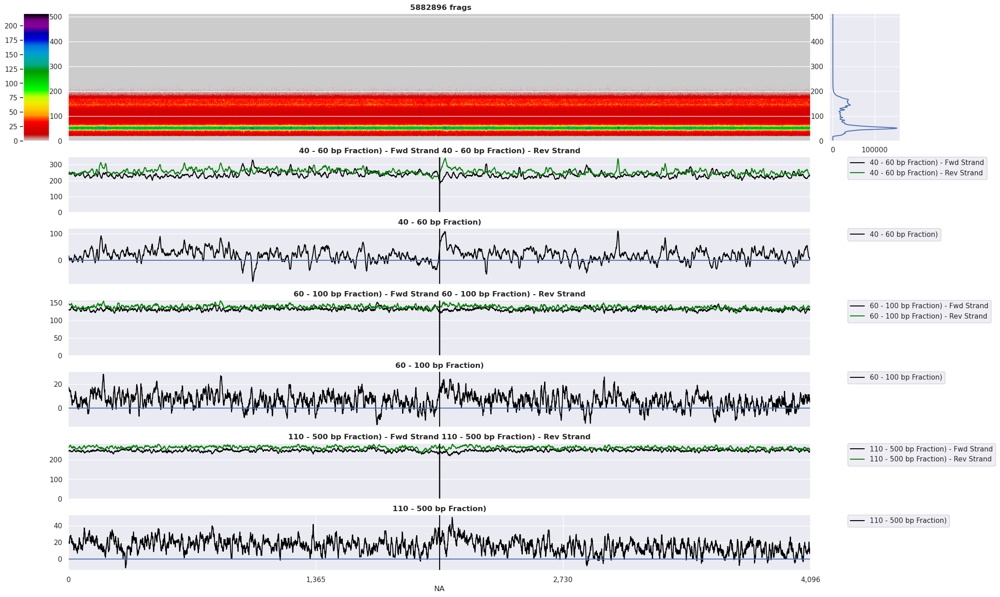

In [74]:
make_single_strand_bndry(merge_fragment_arrays(polya_rdf.fa.tolist())).plot()

(<Figure size 2500x1600 with 9 Axes>,
 [<AxesSubplot:title={'center':' 5258476 frags'}>,
  <AxesSubplot:title={'center':'40 - 60 bp Fraction) - Fwd Strand 40 - 60 bp Fraction) - Rev Strand'}>,
  <AxesSubplot:title={'center':'40 - 60 bp Fraction)'}>,
  <AxesSubplot:title={'center':'60 - 100 bp Fraction) - Fwd Strand 60 - 100 bp Fraction) - Rev Strand'}>,
  <AxesSubplot:title={'center':'60 - 100 bp Fraction)'}>,
  <AxesSubplot:title={'center':'110 - 500 bp Fraction) - Fwd Strand 110 - 500 bp Fraction) - Rev Strand'}>,
  <AxesSubplot:title={'center':'110 - 500 bp Fraction)'}, xlabel='NA'>])

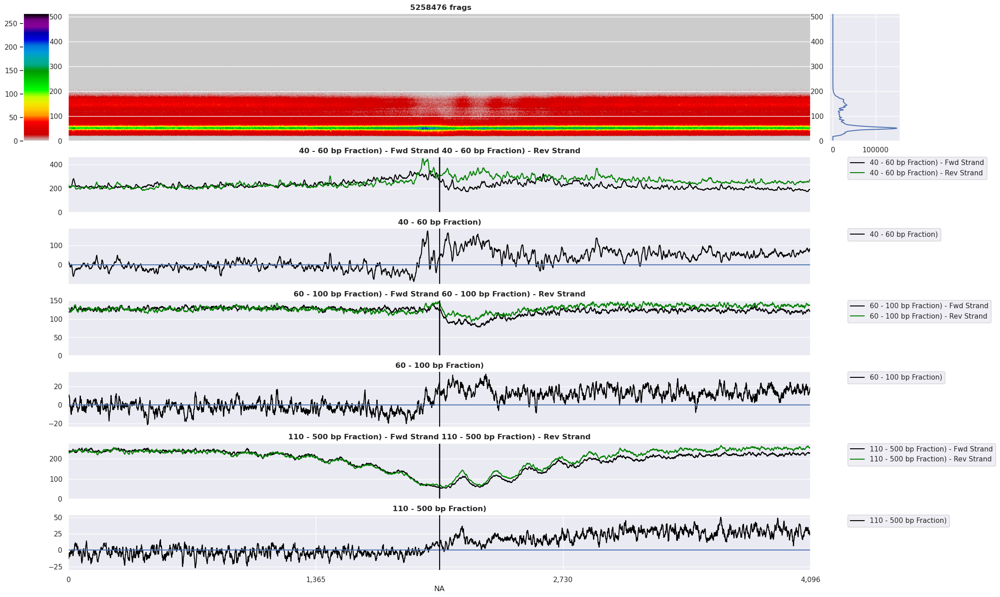

In [75]:
make_single_strand_bndry(merge_fragment_arrays(tss_rdf.fa.tolist())).plot()

In [21]:
expression_rdf = attach_fragment_arrays(labeled_genes.expand_regions(left=4096*2, right=4096*2, strand_aware=True))

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 19007/19007 [18:25<00:00, 17.20it/s]


In [155]:
# def make_plots(_rdf_w_fas):
from fbio.plot.tracks import VectorTrack

def make_gene_cov(rdf, tss_or_polya):
    lengths = pd.DataFrame(dict(start=0, stop=rdf.region_lengths))
    cov = np.zeros(lengths.stop.max())
    if tss_or_polya == 'tss':
        for r in lengths.itertuples():
            cov[r.start:r.stop] += 1
    elif tss_or_polya == 'polya':
         for r in lengths.itertuples():
            cov[-(r.stop-r.start):] += 1
    else:
        raise ValueError(f"tss_or_polya must be either 'tss' or 'polya' (saw {tss_or_polya})")
    cov = cov/lengths.shape[0]
    return cov


def make_on_off_plots(_rdf_w_fas, tss_or_polya):
    if tss_or_polya == 'tss':
        resize_method_name = 'right_resize'
    elif tss_or_polya == 'polya':
        resize_method_name = 'left_resize'
    else:
        raise ValueError(f"Unrecognized value for tss_or_polya '{tss_or_polya}'")

    fl_lb, fl_ub = _rdf_w_fas.n_fragments.quantile([0.05, 0.95])

    on_rdf = _rdf_w_fas.query(f"expression > 25 and n_fragments > {fl_lb} and n_fragments < {fl_ub}")
    off_rdf = _rdf_w_fas.query(f"expression < 0.1 and n_fragments > {fl_lb} and n_fragments < {fl_ub}")
    n_regions = min(on_rdf.shape[0], off_rdf.shape[0])

    if tss_or_polya == 'tss':
        resize_method_name = 'right_resize'
    elif tss_or_polya == 'polya':
        resize_method_name = 'left_resize'
    else:
        assert False, "UNREACHABLE"

    
    all_on_fa = merge_fragment_arrays([getattr(_.reverse_strand_if_negative(), resize_method_name)(1024*24) for _ in on_rdf.sample(n_regions).fa.tolist()]) # cell_type == 'all' and 
    tracks = make_single_strand_tss_tracks(all_on_fa, include_vplot=True, tss_or_polya=tss_or_polya)
    tracks.append(VectorTrack(make_gene_cov(on_rdf, tss_or_polya)[(slice(None, all_on_fa.length) if tss_or_polya == 'tss' else slice(-all_on_fa.length, None))], all_on_fa.plot_region, name='Gene Coverage', ylim=(0, 1)))
    tracks.plot()

    all_off_fa = merge_fragment_arrays([getattr(_.reverse_strand_if_negative(), resize_method_name)(1024*24) for _ in off_rdf.sample(n_regions).fa.tolist()]) # cell_type == 'all' and 
    tracks = make_single_strand_tss_tracks(all_off_fa, include_vplot=True, tss_or_polya=tss_or_polya)
    tracks.append(VectorTrack(make_gene_cov(off_rdf, tss_or_polya)[(slice(None, all_on_fa.length) if tss_or_polya == 'tss' else slice(-all_on_fa.length, None))], all_off_fa.plot_region, name='Gene Coverage', ylim=(0, 1)))
    tracks.plot()

    return

CPU times: user 1min 11s, sys: 6.57 s, total: 1min 18s
Wall time: 1min 18s


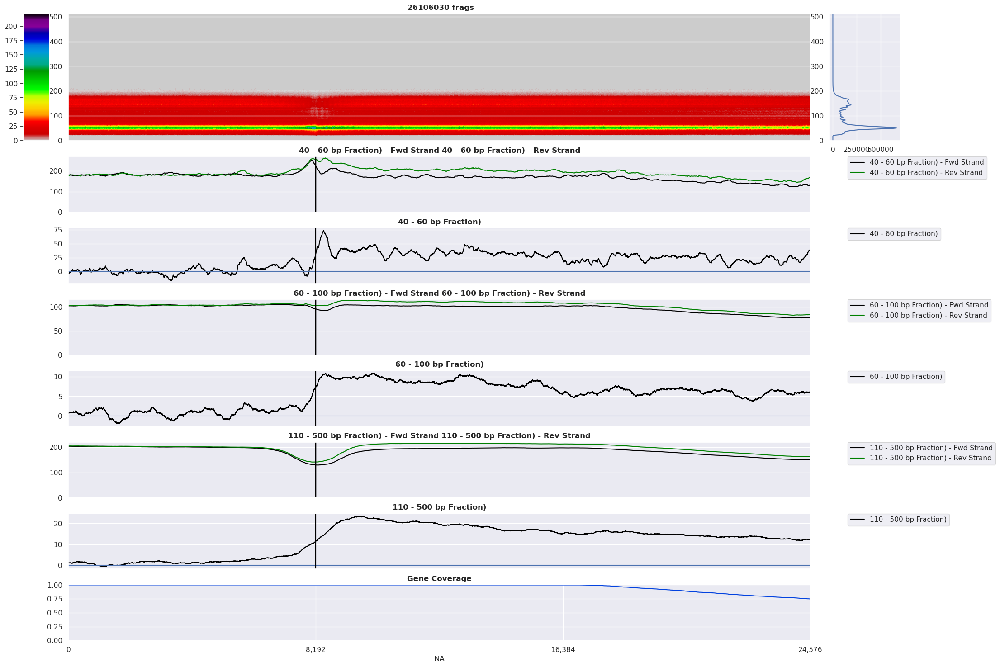

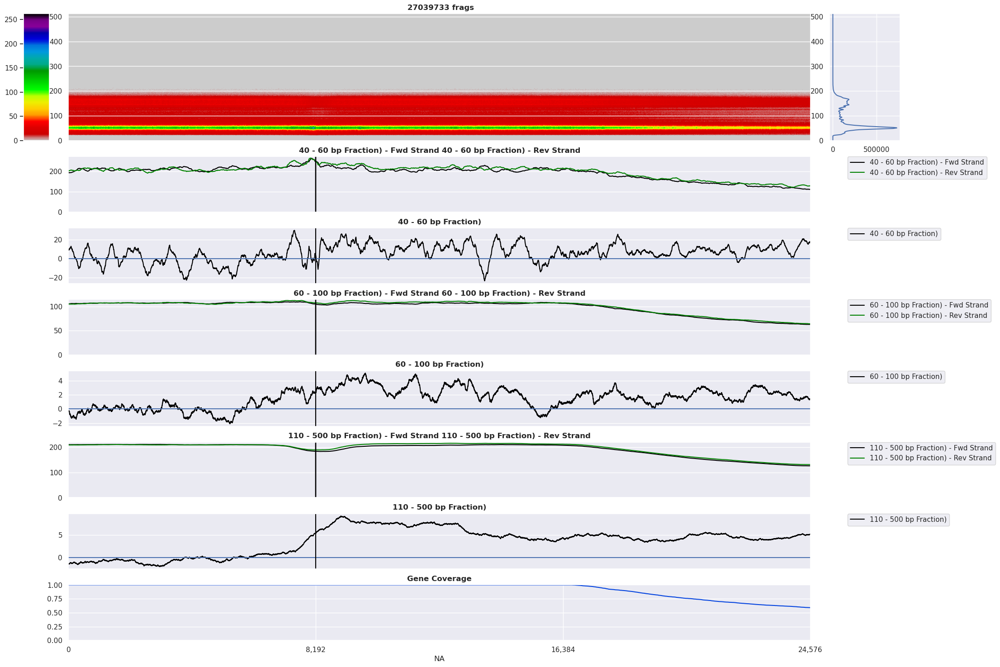

In [23]:
%%time
make_on_off_plots(expression_rdf, 'tss')

CPU times: user 1min 8s, sys: 4.59 s, total: 1min 12s
Wall time: 1min 12s


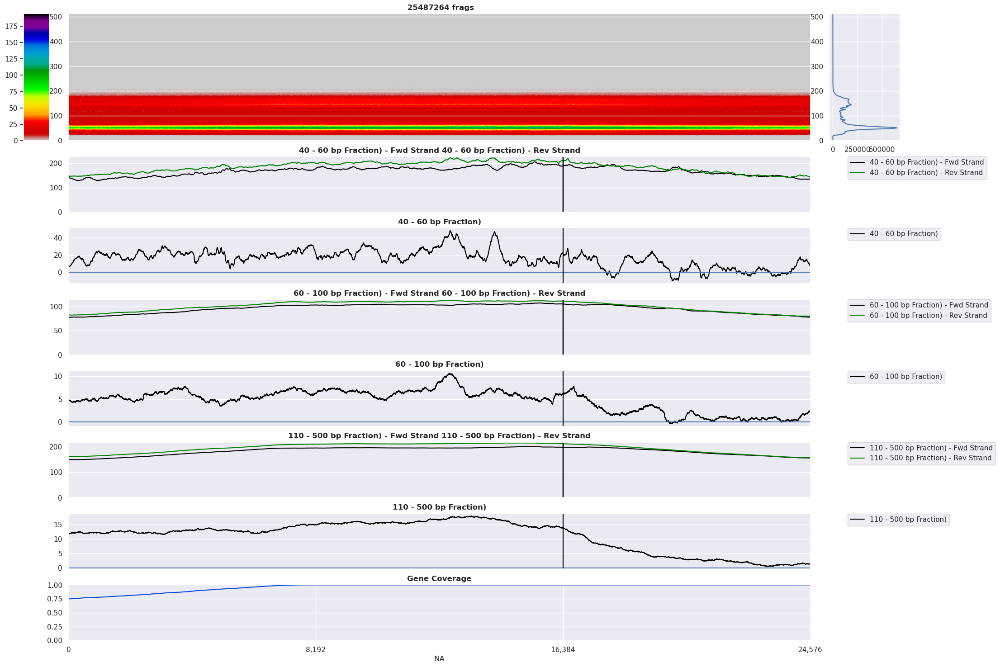

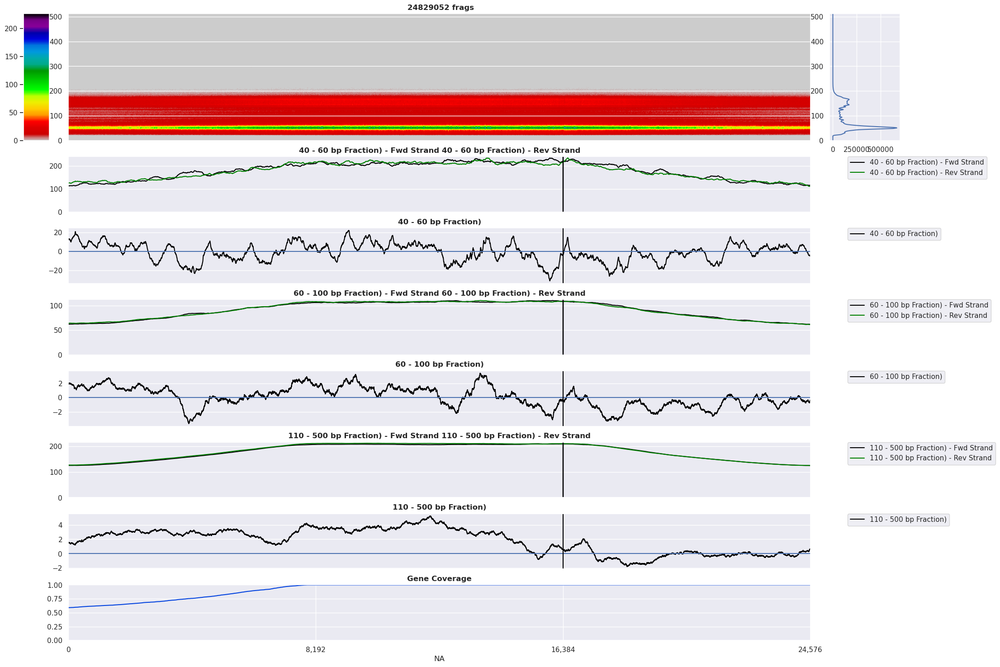

In [24]:
%%time
make_on_off_plots(expression_rdf, 'polya')

# Normalized Coverage Plots

In [25]:
def build_cov_tracks(_fa):
    _fa = _fa.drop_duplicate_fragments().reverse_strand_if_negative()
    cov = []
    for lb, ub in FRAGMENT_BANDS:
        for strand in '+-':
            cov.append(_fa.subset_by_fragment_strand(strand).subset_fragment_lengths(lb, ub).get_midpoint_coverage_array()) 
    return cov

In [26]:
FRAGMENT_BANDS

[(40, 60), (60, 100), (110, 500)]

In [27]:
#%%time
#covs = [[record.gene_id,] + build_cov_tracks(record.fa) for record in tqdm.tqdm(expression_rdf.itertuples(), total=expression_rdf.nrow)]

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 19007/19007 [58:44<00:00,  5.39it/s]

CPU times: user 29min 6s, sys: 29min 38s, total: 58min 45s
Wall time: 58min 44s


In [28]:
#%%time
#cov_df = pd.DataFrame(covs, columns=['gene_id', 'pos_stand_40_60_fl', 'neg_stand_40_60_fl', 'pos_stand_60_100_fl', 'neg_stand_60_100_fl', 'pos_stand_110_500_fl', 'neg_stand_110_500_fl'])

CPU times: user 11.7 ms, sys: 0 ns, total: 11.7 ms
Wall time: 11.3 ms


In [30]:
#%%time
#expression_rdf.set_index('gene_id').join(cov_df.set_index('gene_id')).reset_index().to_pickle("/scratch/karius/df.fa_and_cov.pkl") 

CPU times: user 3.78 s, sys: 1min 5s, total: 1min 9s
Wall time: 3min 33s


In [234]:
%%time
df = pd.read_pickle("/scratch/karius/df.fa_and_cov.pkl") 

CPU times: user 2.92 s, sys: 31.8 s, total: 34.7 s
Wall time: 1min 4s


In [235]:
df

,gene_id,contig,strand,start,stop,fa,fa_length,n_fragments,pos_stand_40_60_fl,neg_stand_40_60_fl,pos_stand_60_100_fl,neg_stand_60_100_fl,pos_stand_110_500_fl,neg_stand_110_500_fl,expression,gene_name
0,ENSG00000186092,chr1,+,57227,79777,"RegionFragmentArray(n_frags=508, region=chr1:+...",22550,508,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.000000,OR4F5
1,ENSG00000187634,chr1,+,915731,952766,"RegionFragmentArray(n_frags=14604, region=chr1...",37035,14604,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.844936,SAMD11
2,ENSG00000188976,chr1,-,936011,967448,"RegionFragmentArray(n_frags=12180, region=chr1...",31437,12180,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",71.417213,NOC2L
3,ENSG00000187961,chr1,+,952392,973911,"RegionFragmentArray(n_frags=8350, region=chr1:...",21519,8350,"[1.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",2.258517,KLHL17
4,ENSG00000187583,chr1,+,958290,983200,"RegionFragmentArray(n_frags=11465, region=chr1...",24910,11465,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.242560,PLEKHN1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17322,ENSG00000277150,chrX,-,155448722,155466812,"RegionFragmentArray(n_frags=1932, region=chrX:...",18090,1932,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.000000,F8A3
17323,ENSG00000185973,chrX,-,155480819,155553469,"RegionFragmentArray(n_frags=16459, region=chrX...",72650,16459,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...",14.875581,TMLHE
17324,ENSG00000168939,chrX,+,155604396,155784987,"RegionFragmentArray(n_frags=76430, region=chrX...",180591,76430,"[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.918662,SPRY3
17325,ENSG00000124333,chrX,+,155873153,155951961,"RegionFragmentArray(n_frags=31473, region=chrX...",78808,31473,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0

In [237]:
from fbio.plot.tracks import VectorTracks
from scipy.signal import savgol_filter

from ravel.bio.frag.fragment_matrix_math import sum_pool
    
import math
def bin_midpoint_coverage(fa, *, n_bins=None, bp_per_bin=None):
    assert n_bins is Nont or bp_per_bin is None
    fa = fa.drop_duplicate_fragments()
    fa = fa.subset_fragment_lengths(110, 150)
    fa = fa.truncate(left_amt=8*1024)

    if n_bins is not None:
        bp_per_bin = math.ceil(fa.length/n_bins)
    elif bp_per_bin is not None:
        bp_per_bin = 100
        n_bins = math.ceil(fa.length/bp_per_bin)
    else:
        raise ValueError("'n_bins' or 'bp_per_bin' must be set")

    fa = fa.three_prime_resize(bp_per_bin*n_bins)
    pos = sum_pool(fa.subset_by_fragment_strand('+').get_midpoint_coverage_array(), bp_per_bin)[:n_bins-1]
    neg = sum_pool(fa.subset_by_fragment_strand('-').get_midpoint_coverage_array(), bp_per_bin)[:n_bins-1]

    return neg, pos


def smooth(y, box_pts):
    box = np.ones(box_pts)/box_pts
    y_smooth = np.convolve(y, box, mode='same')
    return y_smooth

class AggregatedCoverageBounds:

    def __init__(self, _rdf, *, max_region_length, fl_bnds = None, polya_or_tss=None):
        self._rdf = _rdf
        self.max_length = min(_rdf.region_lengths.max(), max_region_length)

        if polya_or_tss not in ('tss', 'polya'):
            raise ValueError("Argument polya_or_tss must be set to either 'polya' or 'tss'")
        self.polya_or_tss = polya_or_tss

        self.fl_bnds = (FRAGMENT_BANDS if fl_bnds is None else [fl_bnds])

        self.data = {}

        for fl_bnds in self.fl_bnds:
            mask = np.zeros(self.max_length)
            c_n = np.zeros(self.max_length)
            c_p = np.zeros(self.max_length)

            for record in _rdf.itertuples():
                if polya_or_tss == 'tss':
                    mask[:record.fa.length] += 1
                elif polya_or_tss == 'polya':
                    mask[-record.fa.length:] += 1
                else:
                    assert False, "Unreachable"

                last_index = min(self.max_length, record.neg_stand_40_60_fl.shape[0])

                if polya_or_tss == 'tss':
                    c_n[:last_index] += getattr(record, f"neg_stand_{fl_bnds[0]}_{fl_bnds[1]}_fl")[:self.max_length]
                    c_p[:last_index] += getattr(record, f"pos_stand_{fl_bnds[0]}_{fl_bnds[1]}_fl")[:self.max_length]
                elif polya_or_tss == 'polya':
                    c_n[-last_index:] += getattr(record, f"neg_stand_{fl_bnds[0]}_{fl_bnds[1]}_fl")[-self.max_length:]
                    c_p[-last_index:] += getattr(record, f"pos_stand_{fl_bnds[0]}_{fl_bnds[1]}_fl")[-self.max_length:]
                else:
                    assert False, "Unreachable"

            self.data[fl_bnds] = (mask, c_n, c_p)

        return

    def score(self, fl_bnds):
        mask, c_n, c_p = self.data[fl_bnds]
        rv = dict(
            score_entire_gene = ((c_n/mask).sum() - (c_p/mask).sum())/((mask.max()/mask.mean())*mask.shape[0]),
        )
        if self.polya_or_tss == 'tss':
            rv['score_first_4kb'] = ((c_n[1024*4:1024*8]/mask[1024*4:1024*8]).sum() - (c_p[1024*4:1024*8]/mask[1024*4:1024*8]).sum())/(1024*4)
        elif self.polya_or_tss == 'polya':
            rv['score_last_4kb'] = ((c_n[-1024*8:-1024*4]/mask[-1024*8:-1024*4]).sum() - (c_p[-1024*8:-1024*4]/mask[-1024*8:-1024*4]).sum())/(1024*4)
        else:
            assert False, 'Unreachable'
                                 
        return rv

    def _get_vlines(self):
        vlines = []
        if self.polya_or_tss == 'tss':
            vlines.append(VLine(1024*8))
        elif self.polya_or_tss == 'polya':
            vlines.append(VLine(self.max_length-1024*8))
        else:
            assert False, "Unreachable"
        return vlines

    def build_tracks(self, smooth_window_len = 150):
        """Build tracks from the output of build_aggregated_coverage_bounds.

        """
        tracks = Tracks()
        diff_tracks = []

        for fl_bnds, (mask, c_n, c_p) in self.data.items():
            pseudo_region = Region('NA', 0, c_n.shape[0])
            tracks.append(
                VectorTrack(c_n/mask, pseudo_region, name=f'{fl_bnds[0]}-{fl_bnds[1]} BP Peak - Neg Strand ', smooth=True, smooth_window_len=smooth_window_len, ylim=(None, None), color='green', vlines=self._get_vlines())
                + VectorTrack(c_p/mask, pseudo_region, name=f'{fl_bnds[0]}-{fl_bnds[1]} BP Peak - Pos Strand ', smooth=True, smooth_window_len=smooth_window_len, ylim=(None, None), color='blue'),
            )
            diff_tracks.append(smooth((c_n - c_p)/mask, 10*smooth_window_len))

        tracks.append(
            VectorTracks(np.vstack(diff_tracks), pseudo_region, colors=['red', 'blue', 'green'], ylim=(-0.001, None), legend=True, labels=[str(x) for x in self.fl_bnds], vlines=self._get_vlines())
        )

        return tracks

def plot_excesses_coverage(_rdf, expression_bnds, polya_or_tss, max_region_length):
    fl_bnds = FRAGMENT_BANDS
    data = {}

    for (lb, ub) in expression_bnds:
        acb = AggregatedCoverageBounds(df.query("@lb < expression < @ub"), fl_bnds=None, polya_or_tss=polya_or_tss, max_region_length=max_region_length)
        for frag_bnds, (mask, c_n, c_p) in acb.data.items():
            if frag_bnds not in data: 
                data[frag_bnds] = []
            data[frag_bnds].append(smooth((c_n - c_p)/mask, int(1*1024)))

    tracks = Tracks()
    for frag_bnds, values in data.items():
        pseudo_region = Region('NA', 0, values[0].shape[0])
        track = VectorTracks(np.vstack(values), pseudo_region, colors=['red', 'green', 'blue'], legend=True, labels=[f"tpm [{x[0]}, {x[1]}]" for x in expression_bnds], ylim=(-0.002, None), vlines=acb._get_vlines())
        track.name = f"fragment sizes {frag_bnds[0]} - {frag_bnds[1]}"
        tracks.append(track)
    tracks.plot(title=f"Excess Rev Strand Fragment Coverage - {polya_or_tss.upper()} Aligned", sharey=False)

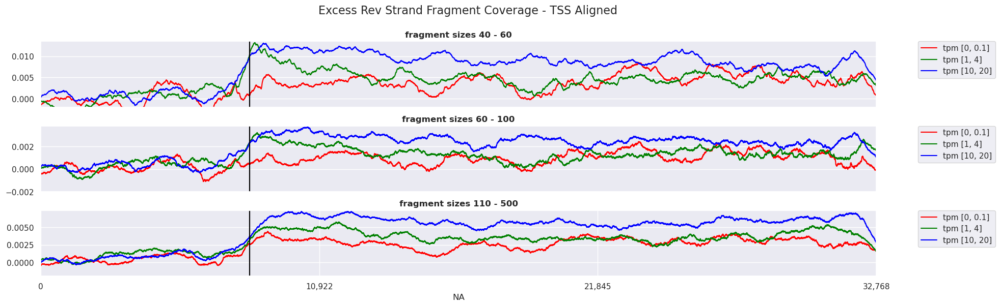

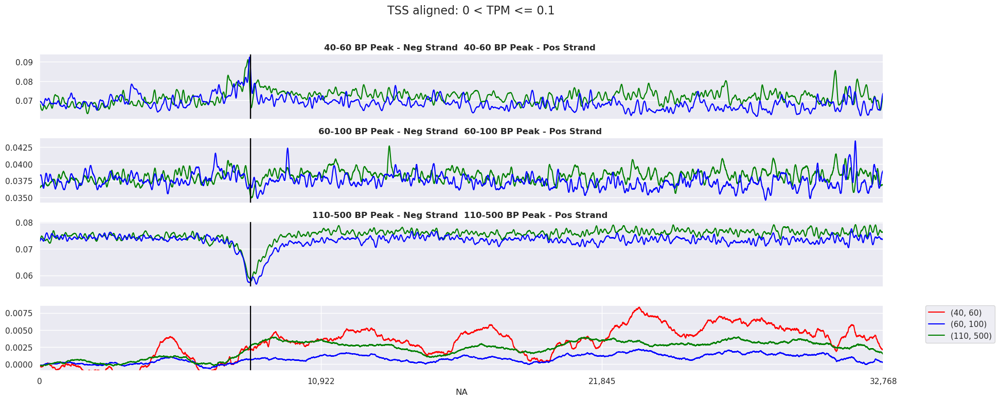

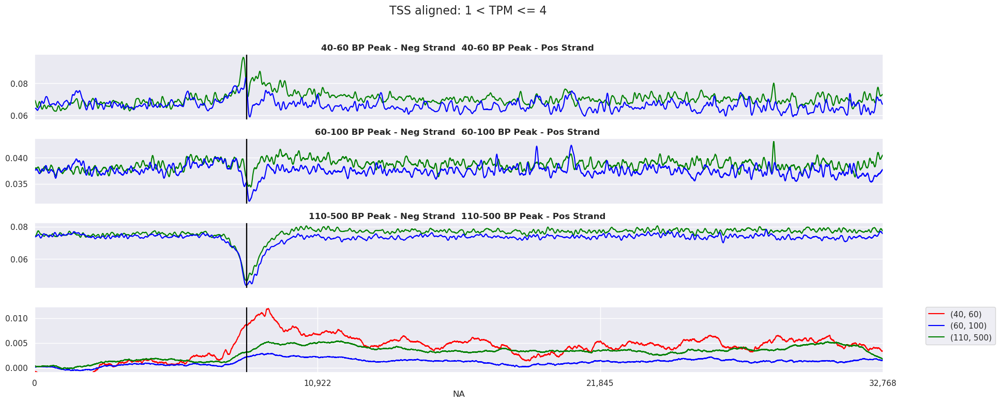

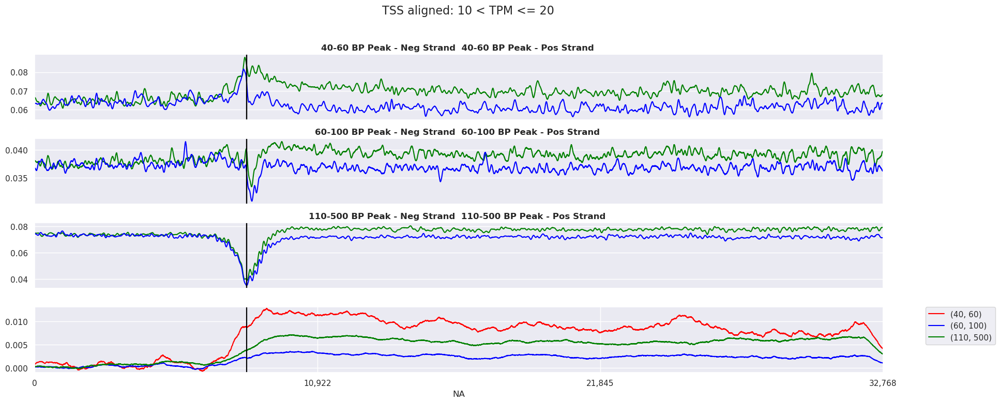

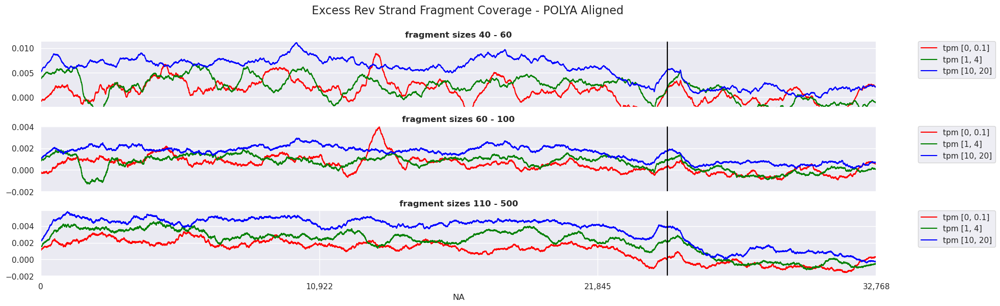

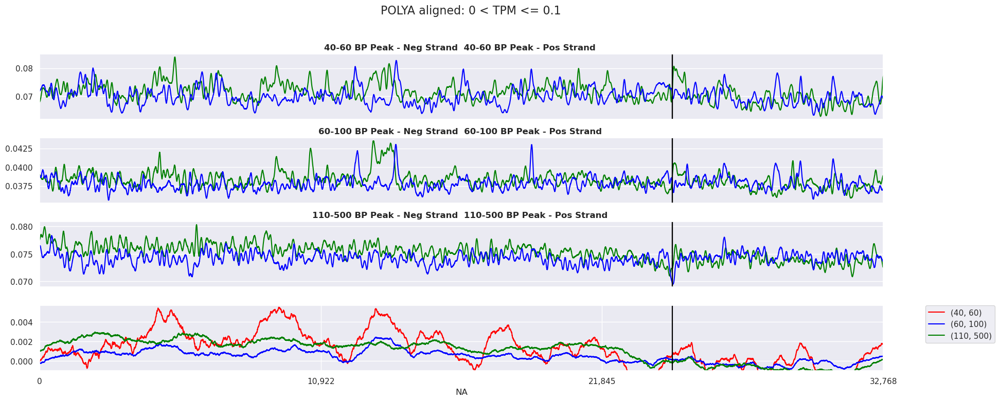

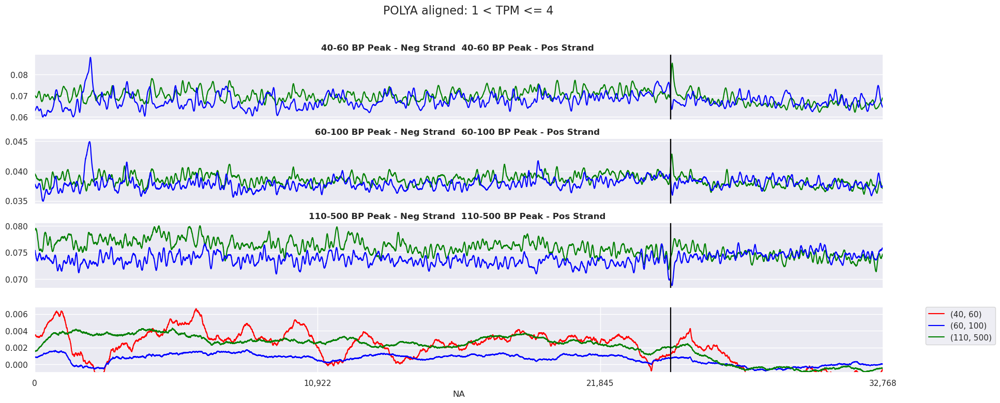

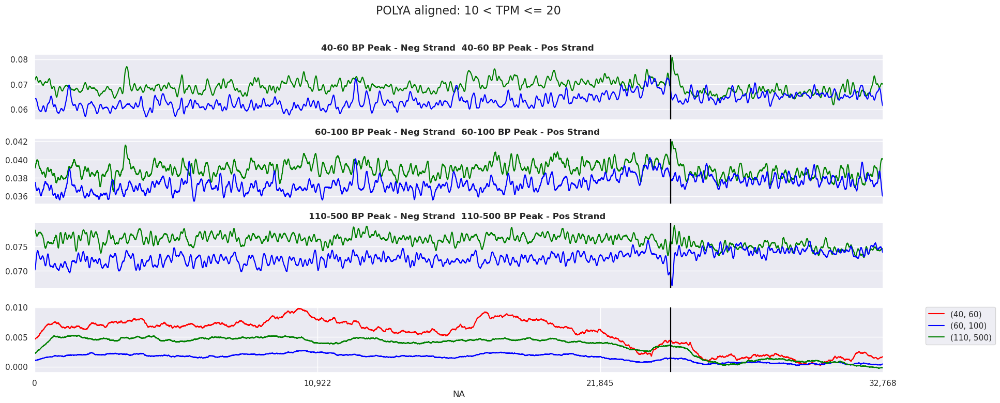

In [238]:
max_region_length = 1024*32
EXPRESSION_BNDS = [(0, 0.1), (1, 4), (10, 20)]
for polya_or_tss in ('tss', 'polya'):
    plot_excesses_coverage(df, EXPRESSION_BNDS, polya_or_tss, max_region_length=max_region_length)
    for lb, ub in EXPRESSION_BNDS:
        acb = AggregatedCoverageBounds(df.query("@lb < expression <= @ub"), polya_or_tss=polya_or_tss, max_region_length=max_region_length)
        acb.build_tracks().plot(title=f"{polya_or_tss.upper()} aligned: {lb} < TPM <= {ub}")

# Custom Scoring

In [256]:
tpm_ranges = [(0, 1e-2), (1e-2, 0.025), (0.025, 0.05), (0.05, 0.1), (0.1, 0.2), (0.2, 0.3), (0.3, 0.4)] + list(zip(range(1, 12), range(2, 13))) + list(zip(range(12, 17, 2), range(14, 19, 2))) + list(zip(range(18, 30, 3), range(21, 33, 3)))

class AggregatedScores():
    def __init__(self, *, n_samples=1):
        res = []
        for tpm_min, tpm_max in tqdm.tqdm(tpm_ranges):
            _sub_df = df.query("@tpm_min < expression <= @tpm_max")
            for bootstrap_num in range(n_samples):
                for polya_or_tss in ('tss', 'polya'):
                    acb = AggregatedCoverageBounds(_sub_df.sample(100, replace=False), polya_or_tss=polya_or_tss, max_region_length=1024*32) # 32kb seems to be the optimal
                    for fl_bnds in acb.fl_bnds:
                        for key, val in acb.score(fl_bnds).items():
                            res.append((key + '_' + polya_or_tss, fl_bnds, round((tpm_min + (tpm_max-tpm_min)/2), 4), bootstrap_num, val))

        self.data = pd.DataFrame(res, columns=['name', 'fl_bnds', 'tpm', 'bootstrap_num', 'score'])

    def normalized_data(self):
        _df = self.data.pivot_table(index=['tpm', 'bootstrap_num'], columns=['name', 'fl_bnds'])
        _df.columns = _df.columns.droplevel()
        _df = _df.reset_index().drop(columns='bootstrap_num')
        _df.columns = [(x[0] + str(x[1])).replace("(", "_FL_").replace(")", "").replace(", ", "_") for x in _df.columns]
        return _df

In [257]:
score_df = AggregatedScores(n_samples=100) # .plot.scatter(x='tpm', y='score')

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 25/25 [01:34<00:00,  3.79s/it]


In [258]:
_df = score_df.normalized_data()

WARNING	2024-02-13 16:59:29,128	/tmp/ipykernel_560121/3678271479.py:20: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  _df = _df.reset_index().drop(columns='bootstrap_num')



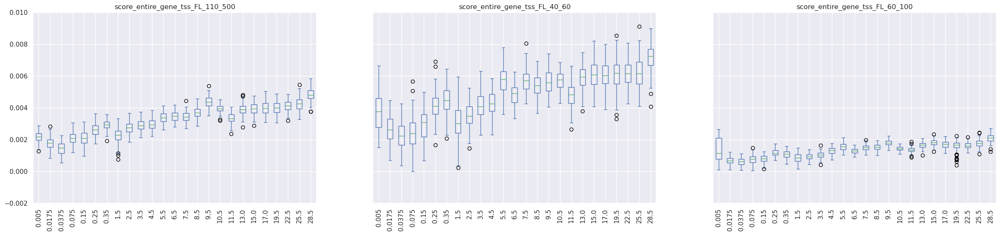

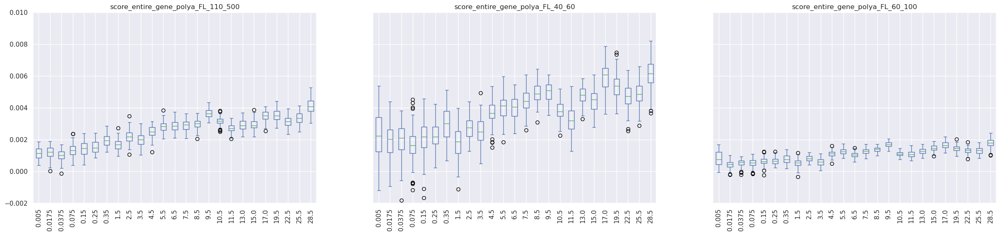

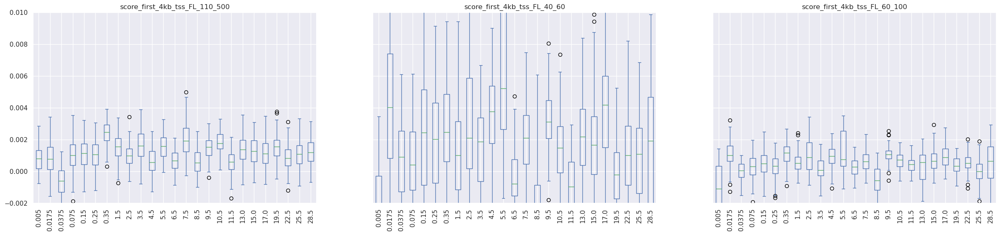

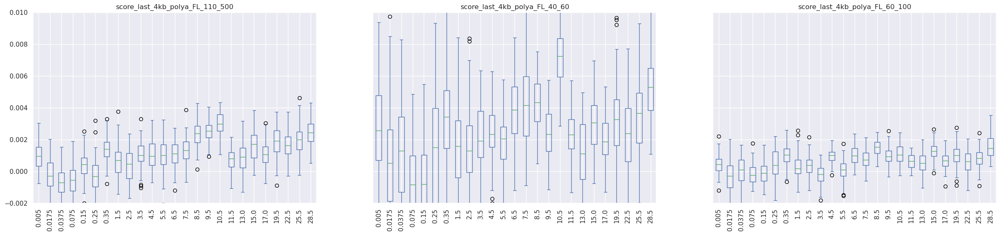

In [255]:
# 48 kb
for column_prefix in ['score_entire_gene_tss', 'score_entire_gene_polya', 'score_first_4kb_tss', 'score_last_4kb_polya']:
    # for column_prefix in ['score_entire_gene_tss_FL_40_60', 'score_entire_gene_tss_FL_60_100', 'score_entire_gene_tss_FL_110_500']:
    _df.plot.box(by='tpm', column=[x for x in _df.columns if x.startswith(column_prefix)], rot=90, figsize=(30, 6), sharey=True, ylim=(-0.002, 0.010))

# Full Gene Scoring

In [278]:
new_tpm_ranges = [(0, 0.1), (0.1, 1), (1, 5), (5, 10), (10, 20), (20, 70), (70, 500)]

def boxplot(df):
    df['tpm_bucket'] = None
    for i, (start, stop) in enumerate(new_tpm_ranges):
        df.loc[(start <= df.expression) & (df.expression < stop), 'tpm_bucket'] = f"{i+1}: TPM {str(start).zfill(1)}-{str(stop).zfill(1)}"
    return df


def score_fa(record, low_fl=40, high_fl=500):
    fa = record.fa.drop_duplicate_fragments()
    fa = fa.subset_fragment_lengths(low_fl, high_fl)
    strands, counts = np.unique(fa.fragment_strands, return_counts=True)
    if fa.strand == '+':
        fwd_mask = (strands == '+')
    elif fa.strand == '-':
        fwd_mask = (strands == '-')
    else:
        assert False, f"UNREACHABLE: ({fa.strand})"

    if counts.sum() < 100:
        return None

    return float((counts[~fwd_mask] - counts[fwd_mask])/counts.sum())

def score(record, low_fl=110, high_fl=500):
    cut = slice(1024*4, -1024*4)
    total_cnt = getattr(record, f"neg_stand_{low_fl}_{high_fl}_fl")[cut].sum() + getattr(record, f"pos_stand_{low_fl}_{high_fl}_fl")[cut].sum()
    if total_cnt < 100:
        return None
    length_norm_total = (getattr(record, f"neg_stand_{low_fl}_{high_fl}_fl")[cut].sum()  - getattr(record, f"pos_stand_{low_fl}_{high_fl}_fl")[cut].sum()) # /(record.stop - record.start - 1024*4*2)
    return length_norm_total/total_cnt


In [279]:
df = boxplot(df)

In [283]:
%%time
scores = df.apply(score_fa, axis=1).rename('score')
scores = pd.concat([pd.DataFrame(df), scores], axis=1)
scores.groupby('tpm_bucket').score.agg(['count', 'mean', 'std'])

CPU times: user 3min 5s, sys: 4.7 s, total: 3min 9s
Wall time: 3min 9s


,count,mean,std
tpm_bucket,,,
1: TPM 0-0.1,4083,0.005606,0.058533
2: TPM 0.1-1,1867,0.016880,0.054085
3: TPM 1-5,1724,0.017711,0.049500
4: TPM 5-10,1135,0.027853,0.046714
5: TPM 10-20,1687,0.031633,0.045613
6: TPM 20-70,3958,0.035132,0.048677
7: TPM 70-500,2539,0.036113,0.046029


<AxesSubplot:title={'center':'score'}, xlabel='[tpm_bucket]'>

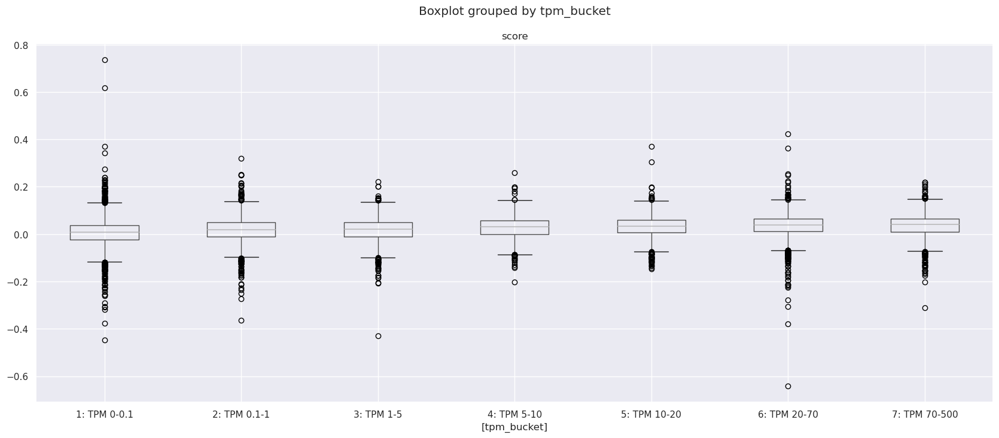

In [286]:
scores[['tpm_bucket', 'score']].dropna().sort_values('tpm_bucket').boxplot(by='tpm_bucket') # , x='tpm_bucket', y='score', multiple='dodge')

In [472]:
%%time
scores = df.apply(score_fa, axis=1).rename('score')
scores = pd.concat([pd.DataFrame(df), scores], axis=1)
scores.groupby('tpm_bucket').score.agg(['count', 'mean', 'std'])

CPU times: user 3min 6s, sys: 3.84 s, total: 3min 10s
Wall time: 3min 10s


,count,mean,std
tpm_bucket,,,
,1060,0.025120,0.036222
1: 0000-00.1,4383,0.007260,0.039768
2: 00.1-0001,2494,0.011914,0.036817
3: 0001-0005,2954,0.019509,0.034870
4: 0005-0010,2328,0.025521,0.034295
5: 0010-0020,2947,0.028300,0.032828
6: 0020-0050,2690,0.029547,0.033372


<AxesSubplot:xlabel='tpm_bucket', ylabel='score'>

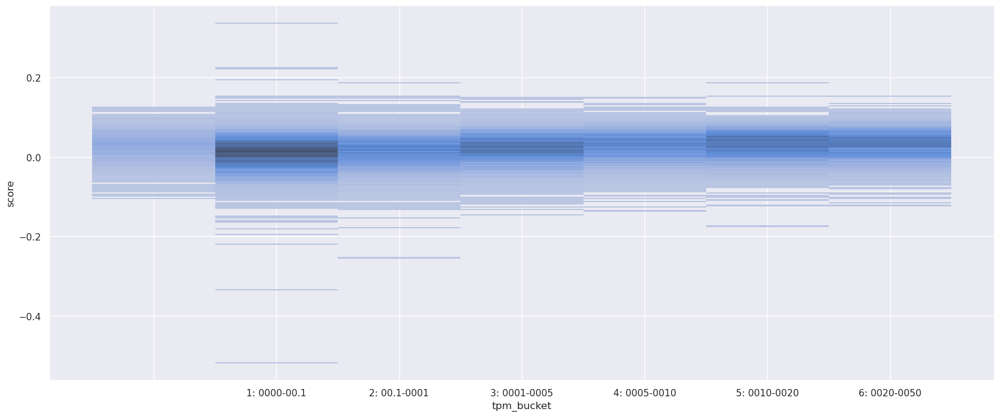

In [473]:
import seaborn as sns
sns.histplot(scores[['tpm_bucket', 'score']].dropna().sort_values('tpm_bucket'), x='tpm_bucket', y='score', multiple='dodge')

# scRNA Seq

In [224]:
%%time
just_expression_rdf = load_SC_RNA_labeled_genes()

CPU times: user 14.7 s, sys: 159 ms, total: 14.9 s
Wall time: 14.9 s


In [225]:
just_expression_rdf

,gene_name,gene_id,contig,strand,start,stop,expression
0,A1BG,ENSG00000121410,chr19,-,58345183,58353492,62.542394
1,A1CF,ENSG00000148584,chr10,-,50799409,50859985,0.000000
2,A2M,ENSG00000175899,chr12,-,9067708,9115919,0.077835
3,A2ML1,ENSG00000166535,chr12,+,8822621,8875012,0.197852
4,A4GALT,ENSG00000128274,chr22,-,42692121,42695631,2.158199
...,...,...,...,...,...,...,...
17348,ZXDC,ENSG00000070476,chr3,-,126437601,126475891,19.699126
17349,ZYG11A,ENSG00000203995,chr1,+,52842511,52893790,0.000000
17350,ZYG11B,ENSG00000162378,chr1,+,52726453,52805524,28.688477
17351,ZYX,ENSG00000159840,chr7,+,143381345,143391109,118.715634


In [153]:
%%time
# on_off_rdf = attach_fragment_arrays(on_off_rdf)
# expression_rdf = attach_fragment_arrays(expression_rdf.expand_regions(left=4096*2, right=4096*2, strand_aware=True))

CPU times: user 1 µs, sys: 0 ns, total: 1 µs
Wall time: 5.48 µs


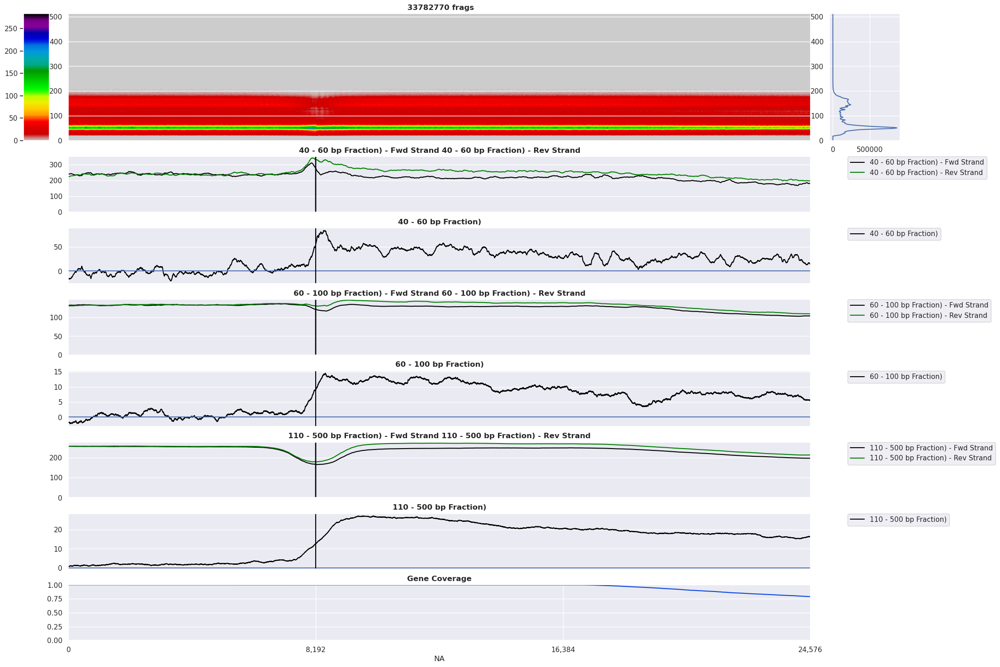

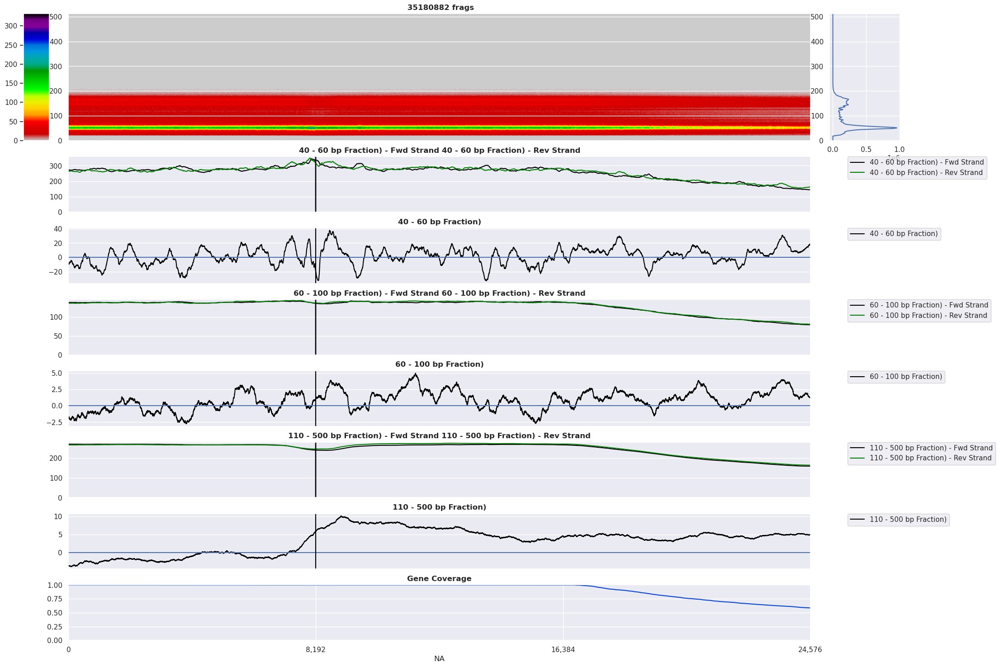

In [156]:
make_on_off_plots(expression_rdf, 'tss')

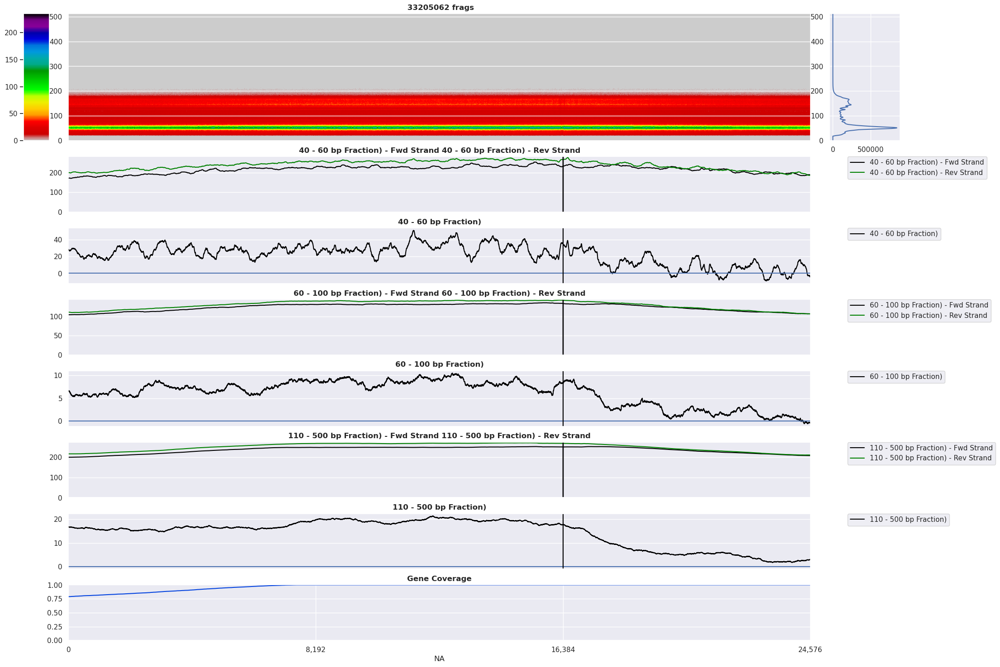

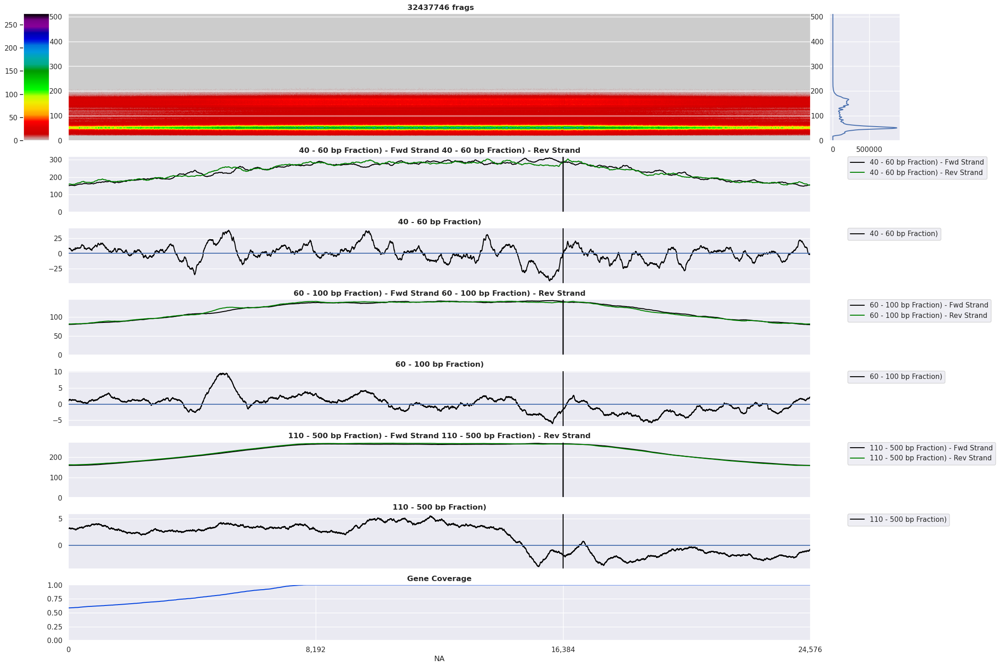

In [158]:
make_on_off_plots(expression_rdf, 'polya')